In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import time

In [2]:
img1 = cv2.imread('20201121_114052.jpg')
img2 = cv2.imread('20201121_114100.jpg')
img3 = cv2.imread('20201121_114218.jpg')
img4 = cv2.imread('20201121_114222.jpg')

img5 = cv2.imread('20201126_210905.jpg')
img6 = cv2.imread('20201126_210913.jpg')
img7 = cv2.imread('20201126_210924.jpg')
img8 = cv2.imread('20201126_210933.jpg')

img9 = cv2.imread('20201129_193754.jpg')
img10 = cv2.imread('20201129_194042.jpg')
img11 = cv2.imread('20201129_195632.jpg')

### view this drum

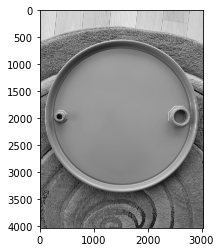

In [3]:
img = img4.copy()
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(img, cmap='gray')

# class declarations

In [3]:
class InvalidCirclesFound(Exception):
    pass

# one time vars

wieko

In [4]:
r2_ref = 57.0

detekcja korków

In [5]:
template_kd = cv2.imread('korekd1.jpg',0)
template_km = cv2.imread('korekm2.jpg',0)
method = eval('cv2.TM_CCOEFF')

# Funkcje

In [6]:
def get_img_characteristics(img):
    xp, yp = img.shape
    min_p = min(img.shape)
    max_p = max(img.shape)
    rect_thickness = int(min_p/100)
    
    return xp, yp, min_p, max_p, rect_thickness

In [7]:
def morph_img(th, img, min_p):
    kernel_shape = int(min_p * 0.005)
    kernel_shape2 = int(min_p * 0.015)
    
    kernel = np.ones((kernel_shape,kernel_shape),np.uint8)
    kernel2 = np.ones((kernel_shape2,kernel_shape2),np.uint8)
    morphed = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel)
    morphed = cv2.morphologyEx(morphed, cv2.MORPH_CLOSE, kernel2)
    fg = cv2.bitwise_and(img, img, mask=morphed)
    
    return fg

In [8]:
def get_edges(fg):
    fg_bin = cv2.medianBlur(fg,25) #############################################BYLO 5,7
    fg_bin = cv2.adaptiveThreshold(fg_bin,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
                cv2.THRESH_BINARY,11,2) ##############tu trzeba pokombinowac
    fg_bin = cv2.medianBlur(fg_bin,5)
    edges2 = cv2.Canny(fg_bin, 255/3, 255, apertureSize=3)
    
    return edges2

In [9]:
def find_h_circles(img_edges,img, max_p, min_p, draw=True):
    circles = cv2.HoughCircles(img_edges,cv2.HOUGH_GRADIENT,1,max_p, param1=5,param2=125,minRadius=int(min_p*0.4),maxRadius=int(min_p*0.6))
    
    try:
        circles = np.uint16(np.around(circles))
        l_circles = len(circles[0])
    except TypeError as e:
        raise InvalidCirclesFound(e)

    if l_circles != 1:
        raise InvalidCirclesFound('There is an incorrect number of circles available: ', l_circles)
    
    c_i = circles[0][0]
    
    if draw:
        # draw the outer circle
        cv2.circle(img,(c_i[0],c_i[1]),c_i[2],(0,0,255),50)
        # draw the center of the circle
        cv2.circle(img,(c_i[0],c_i[1]),2,(0,0,255),30)
        
    return c_i

In [10]:
def match_temp(img, img_edges, img_template, method, rect_thickness, draw=True):
    res = cv2.matchTemplate(img_edges,img_template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    top_left = max_loc
    w_kd, h_kd = img_template.shape[::-1]
    bottom_right = (top_left[0] + w_kd, top_left[1] + h_kd)
    
    if draw:
        cv2.rectangle(img,top_left, bottom_right, 255, rect_thickness)
        
    return top_left, bottom_right

In [11]:
def calc_dist_to_temp(top_left, bottom_right, c_i, skala):
    d = ((bottom_right[0] - top_left[0])/2 + top_left[0], (bottom_right[1] - top_left[1])/2 + top_left[1])
    c = (c_i[0], c_i[1])
    dist = np.sqrt((c[0] - d[0])**2 + (c[1] - d[1]) **2)
    
    return dist/skala

# wersja krok po kroku

In [33]:
img = cv2.cvtColor(img11, cv2.COLOR_BGR2GRAY)

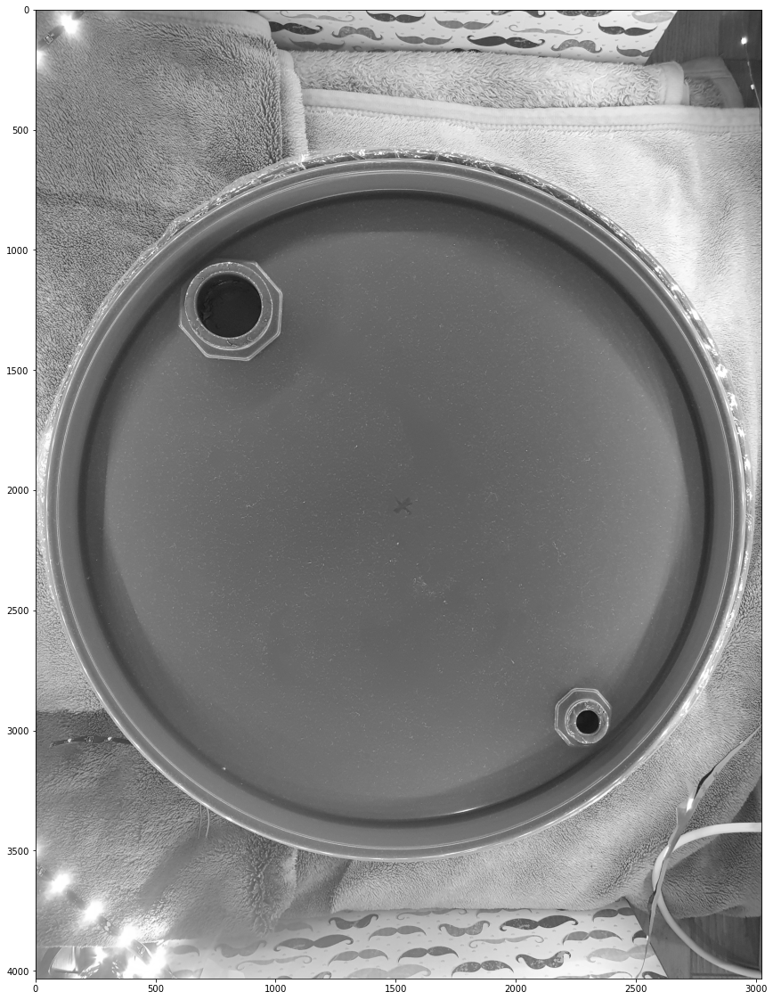

In [34]:
plt.figure(figsize=(20,20))
plt.imshow(img, cmap='gray')

In [35]:
#gray
_,th = cv2.threshold(img,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)


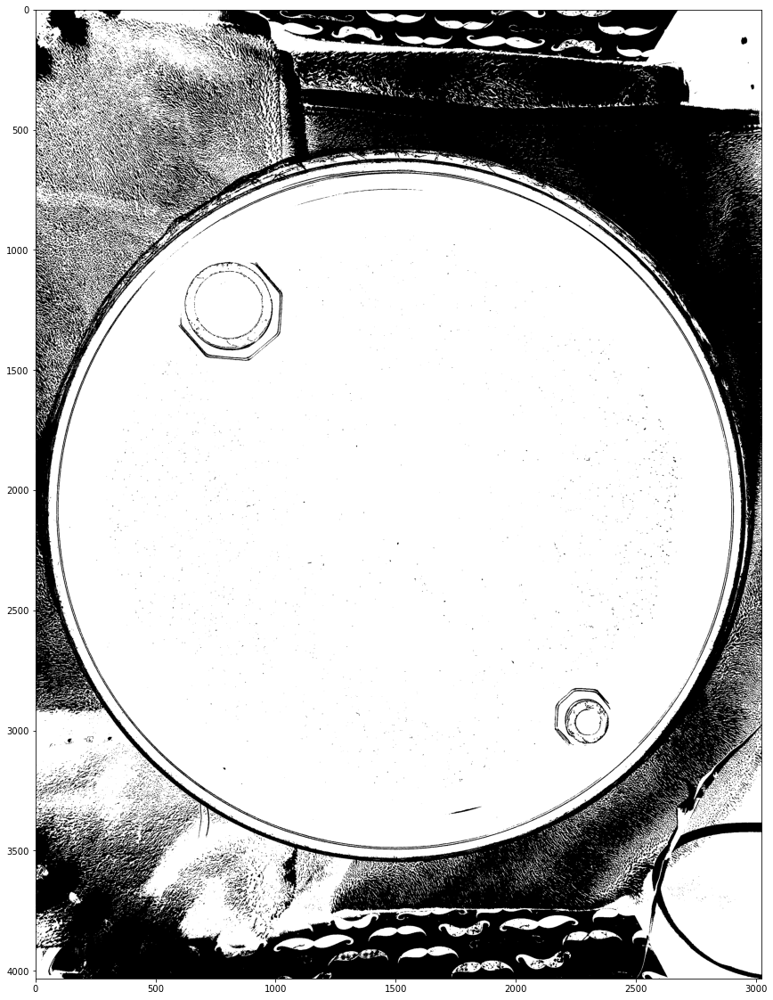

In [36]:
plt.figure(figsize=(20,20))
plt.imshow(th, cmap='gray')

In [37]:
min_p = min(img.shape)

kernel_shape = int(min_p * 0.005)
kernel_shape2 = int(min_p * 0.015)

kernel = np.ones((kernel_shape,kernel_shape),np.uint8)
kernel2 = np.ones((kernel_shape2,kernel_shape2),np.uint8)
morphed = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel)
morphed = cv2.morphologyEx(morphed, cv2.MORPH_CLOSE, kernel2)
fg = cv2.bitwise_and(img, img, mask=morphed)

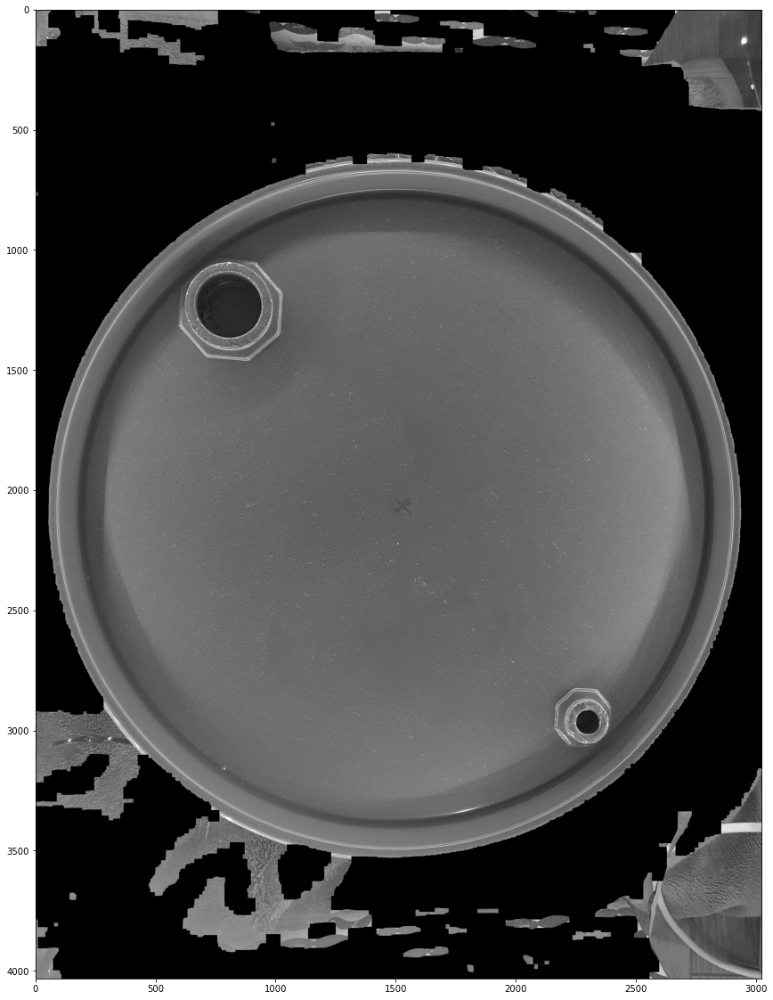

In [38]:
plt.figure(figsize=(20,20))
plt.imshow(fg, cmap='gray')

In [39]:

#img constants
xp, yp, min_p, max_p, rect_thickness = get_img_characteristics(img)

#morph filters
fg = morph_img(th, img, min_p)


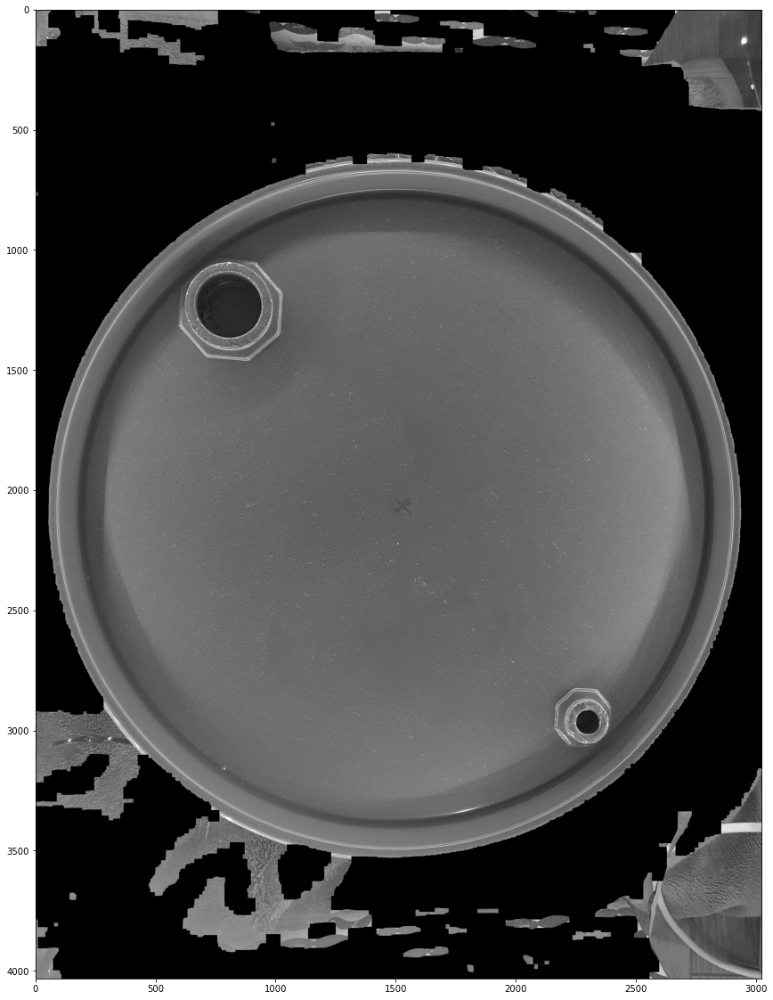

In [40]:
plt.figure(figsize=(20,20))
plt.imshow(fg, cmap='gray')

In [41]:
#bin&edges
edges2 = get_edges(fg)

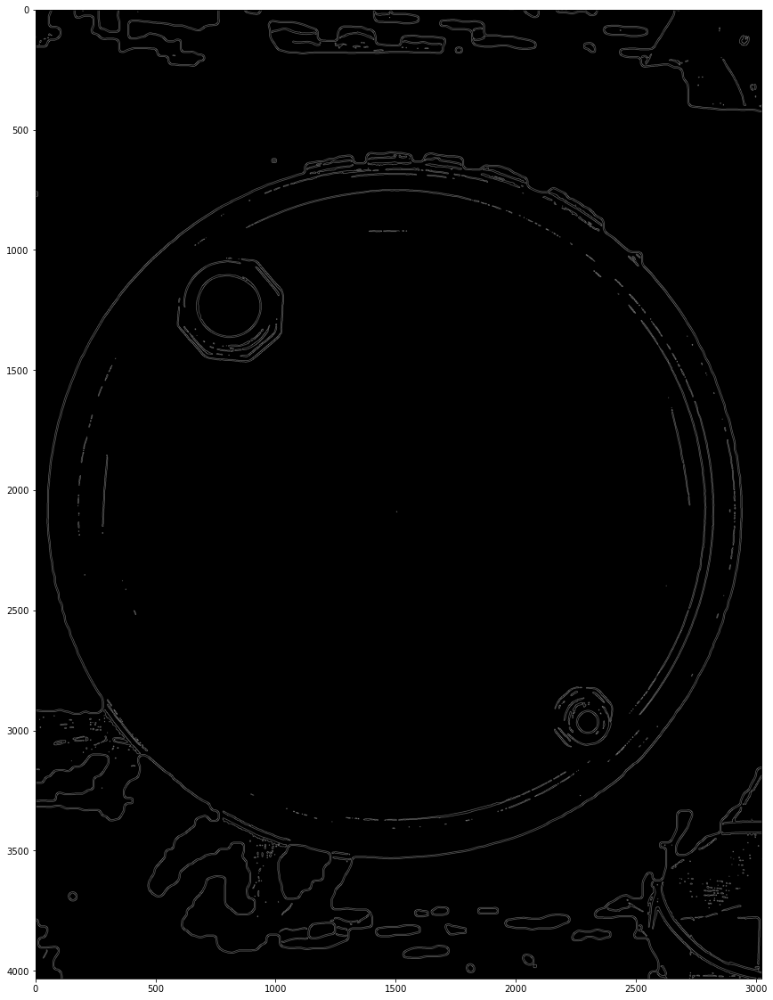

In [42]:
plt.figure(figsize=(20,20))
plt.imshow(edges2,cmap='gray')

In [43]:
ts = time.time()
circles = cv2.HoughCircles(edges2,cv2.HOUGH_GRADIENT,1,4024, param1=5,param2=125,minRadius=1200,maxRadius=1800)
time.time() - ts

0.4867208003997803

In [44]:
circles

array([[[1478.5, 2059.5, 1427.5]]], dtype=float32)

In [45]:
contours, hierarchy = cv2.findContours(edges2,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
len(contours)

1231

nie ma sensu na tym

In [46]:
# ts = time.time()
# cv2.HoughCircles(fg,cv2.HOUGH_GRADIENT,1,4024, param1=5,param2=125,minRadius=1200,maxRadius=1800)
# time.time() - ts

In [47]:
# contours, hierarchy = cv2.findContours(fg,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
# len(contours)

### próba filtrów LPF

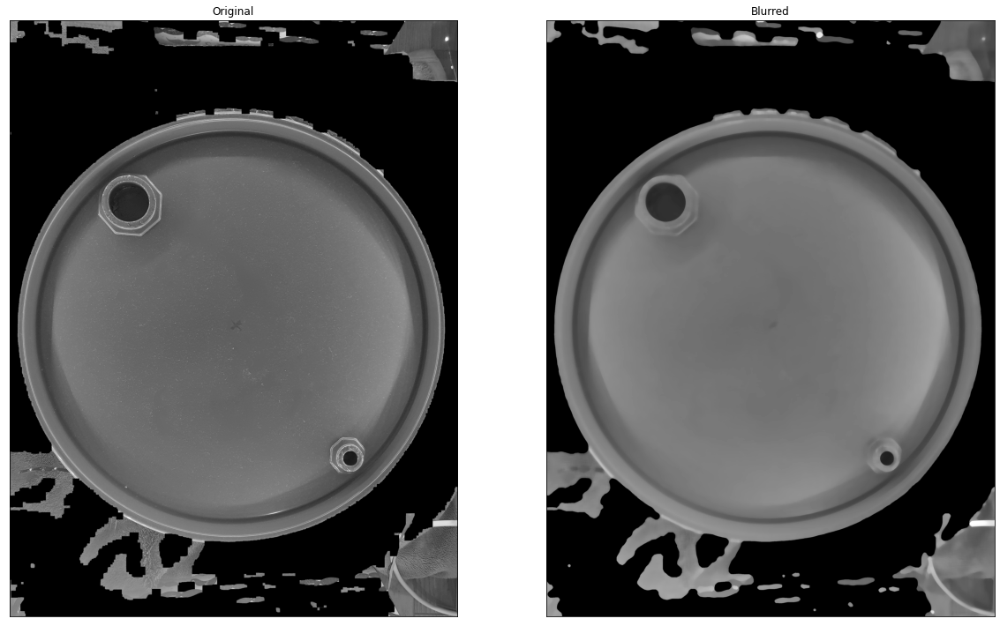

In [48]:
fgg = fg.copy()

median = cv2.medianBlur(fgg,35)

plt.figure(figsize=(20,20))
plt.subplot(121),plt.imshow(fgg, cmap='gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median, cmap='gray'),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

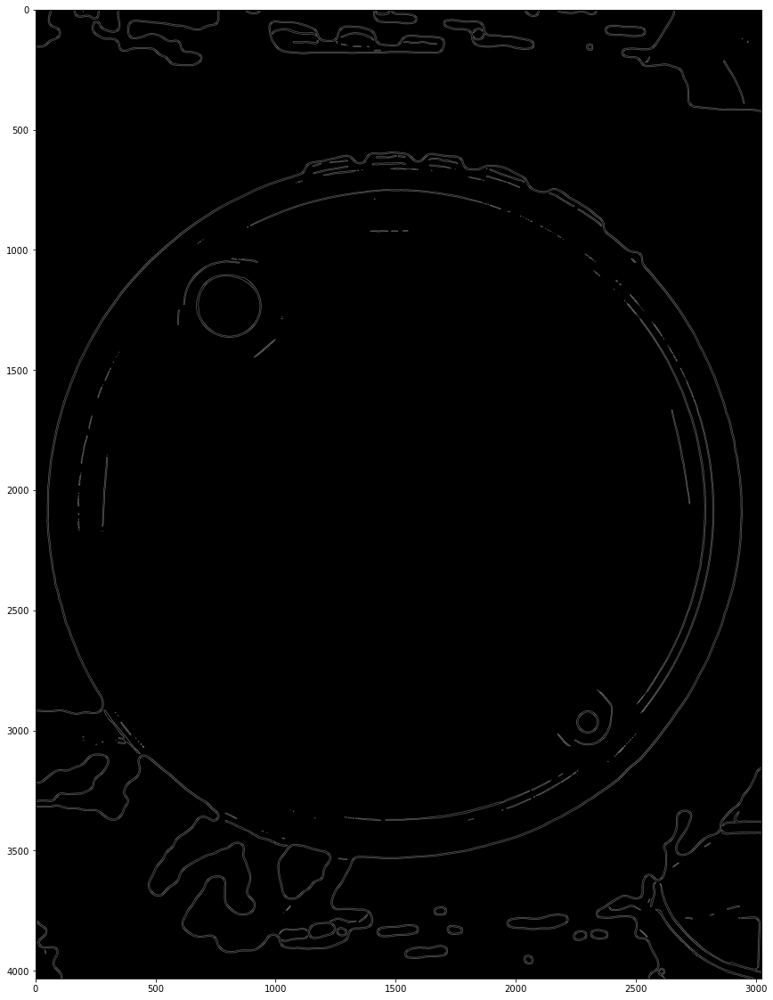

In [49]:

#bin&edges
edges3 = get_edges(median)

plt.figure(figsize=(20,20))
plt.imshow(edges3,cmap='gray')

In [50]:
ts = time.time()
circles = cv2.HoughCircles(edges3,cv2.HOUGH_GRADIENT,1,4024, param1=5,param2=125,minRadius=1200,maxRadius=1800)
time.time() - ts

0.39434385299682617

In [52]:
circles

array([[[1498.5, 2082.5, 1413.3]]], dtype=float32)
array([[[1496.5, 2079.5, 1413.3]]], dtype=float32)
array([[[1480.5, 2062.5, 1429.6]]], dtype=float32)

# powyższe to wniosek, że nie ma co robić innego median filtru oprócz w funkcji get_edges

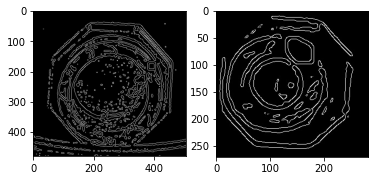

In [53]:
x1 = cv2.imread('korekd1.jpg',0)
x2 = cv2.imread('korekm2.jpg',0)
plt.subplot(1,2,1); plt.imshow(x1,cmap='gray')
plt.subplot(1,2,2); plt.imshow(x2,cmap='gray')

# funkcyjnie całość

2.2127320766448975 21.00048398855327 23.119313508816333


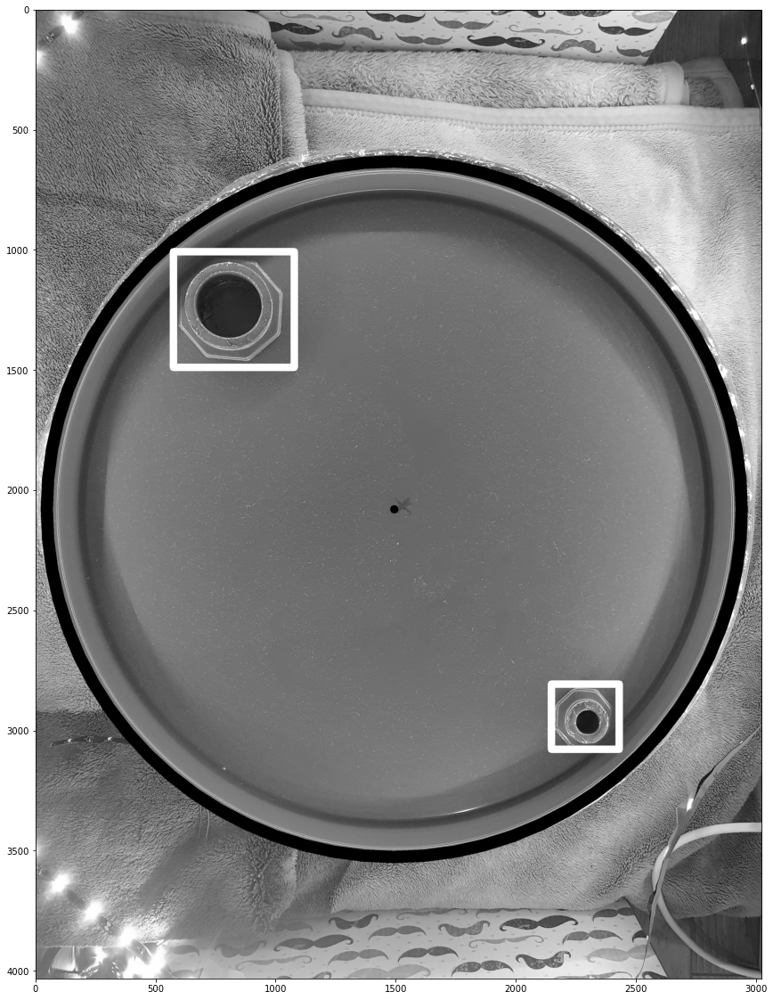

In [57]:
ts = time.time()
#load
img = img11.copy()

#gray
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
_,th = cv2.threshold(img,150,255,cv2.THRESH_BINARY_INV)

#img constants
xp, yp, min_p, max_p, rect_thickness = get_img_characteristics(img)

#morph filters
fg = morph_img(th, img, min_p)

#bin&edges
edges2 = get_edges(fg)

#circles
c_i = find_h_circles(edges2,img, max_p, min_p, draw=True)

#match template
top_left_kd, bottom_right_kd = match_temp(img, edges2, template_kd, method, rect_thickness, draw=True)
top_left_km, bottom_right_km = match_temp(img, edges2, template_km, method, rect_thickness, draw=True)
    
#calc dist from drum center to kd
r2 = c_i[2]*2
skala = r2/r2_ref

dist_kd = calc_dist_to_temp(top_left_kd, bottom_right_kd, c_i, skala)
dist_km = calc_dist_to_temp(top_left_km, bottom_right_km, c_i, skala)

#print
print(time.time() - ts, dist_kd, dist_km)
plt.figure(figsize=(20,20))
plt.imshow(img, cmap='gray')

# full z jedną funkcją, iteracja po img

In [61]:
counter = 0

In [62]:
def full_func(img):
    global counter
    counter += 1
    
    #meas time
    ts = time.time()
    
    #gray
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #_,th = cv2.threshold(img,150,255,cv2.THRESH_BINARY_INV)
    _,th = cv2.threshold(img,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

    #img constants
    xp, yp, min_p, max_p, rect_thickness = get_img_characteristics(img)

    #morph filters
    fg = morph_img(th, img, min_p)

    #bin&edges
    edges2 = get_edges(fg)

    #circles
    c_i = find_h_circles(edges2,img, max_p, min_p, draw=True)

    #match template
    top_left_kd, bottom_right_kd = match_temp(img, edges2, template_kd, method, rect_thickness, draw=True)
    top_left_km, bottom_right_km = match_temp(img, edges2, template_km, method, rect_thickness, draw=True)

    #calc dist from drum center to kd
    r2 = c_i[2]*2
    skala = r2/r2_ref

    dist_kd = calc_dist_to_temp(top_left_kd, bottom_right_kd, c_i, skala)
    dist_km = calc_dist_to_temp(top_left_km, bottom_right_km, c_i, skala)

    #print
    print(counter, time.time() - ts, dist_kd, dist_km)
    plt.figure(figsize=(20,20))
    plt.subplot(1,2,1); plt.imshow(img, cmap='gray')
    plt.subplot(1,2,2); plt.imshow(edges2, cmap='gray')
    
    cv2.imwrite(str(counter)+'.jpg', edges2)

14 2.2617034912109375 20.933905174619902 23.32503115826875
15 3.6604206562042236 21.08365399892257 22.569889975390122
16 1.9139046669006348 24.013960489341308 25.612225192550987
17 2.6617579460144043 24.870054599059817 25.487727989203222
18 1.8802542686462402 23.339996668920755 29.85844517170074
19 1.971693992614746 24.093133423068863 21.703425437384837
20 2.368424415588379 24.125447674984258 33.849044425325
21 2.6525046825408936 23.044335671791604 20.972287578965062
22 3.074788808822632 21.051196456276138 23.931984880113003
23 2.4219257831573486 21.015017195465763 23.13531303373593


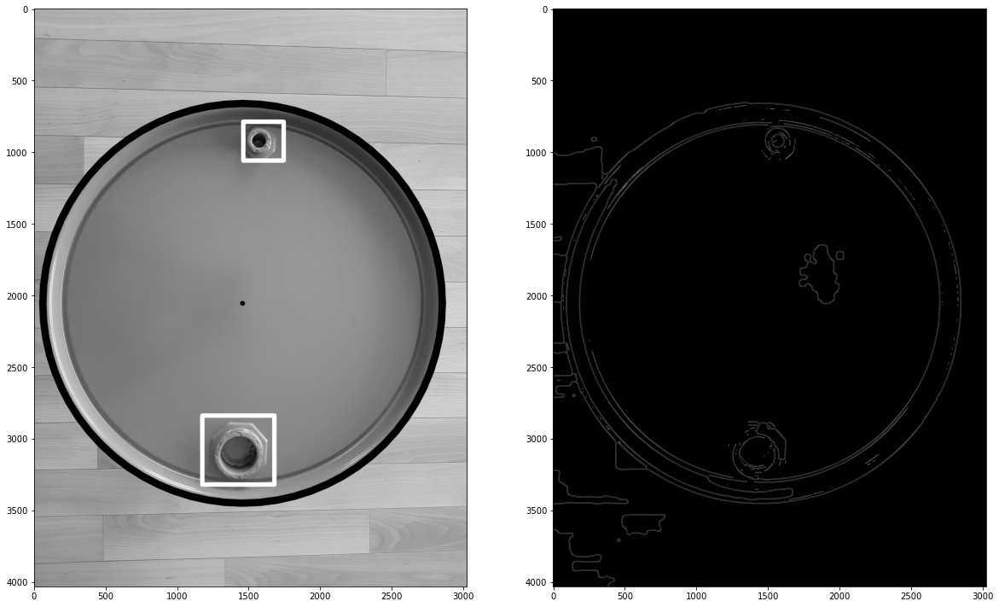

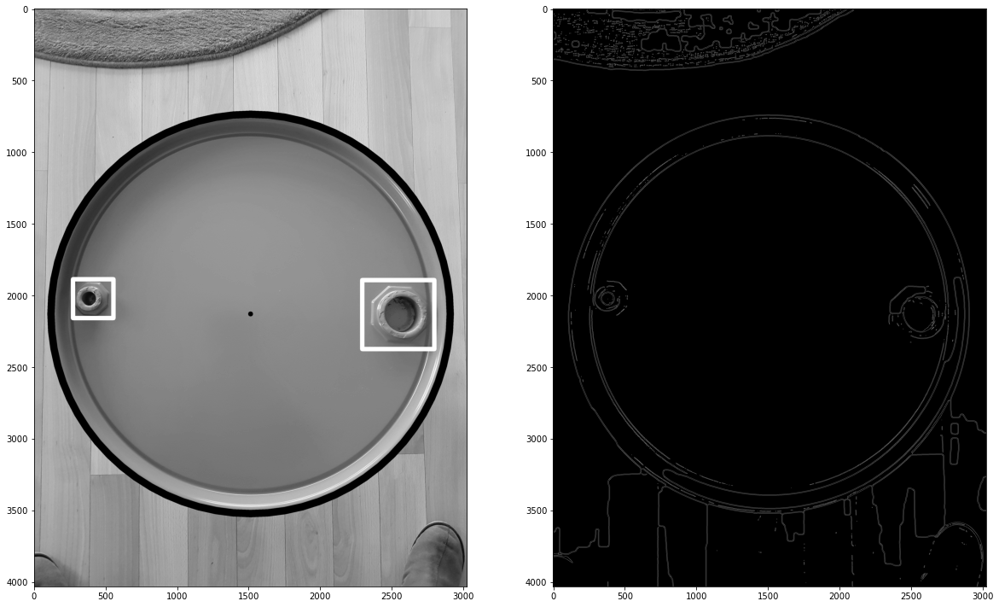

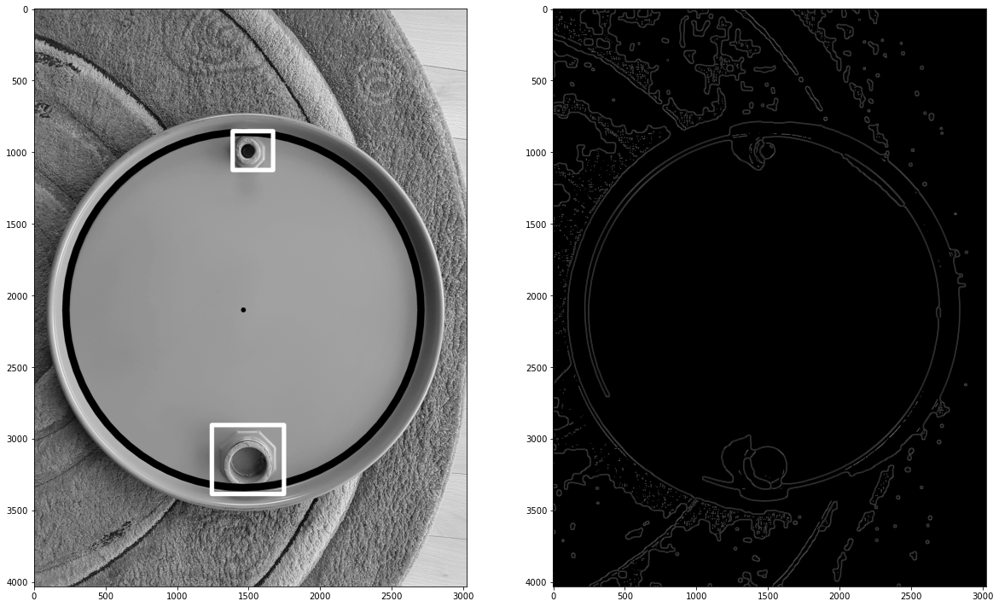

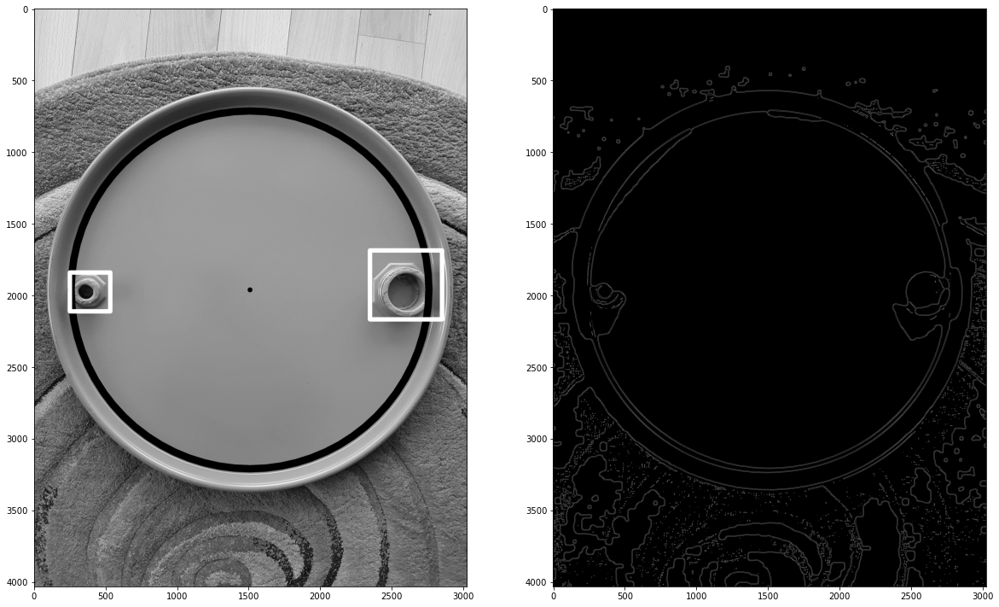

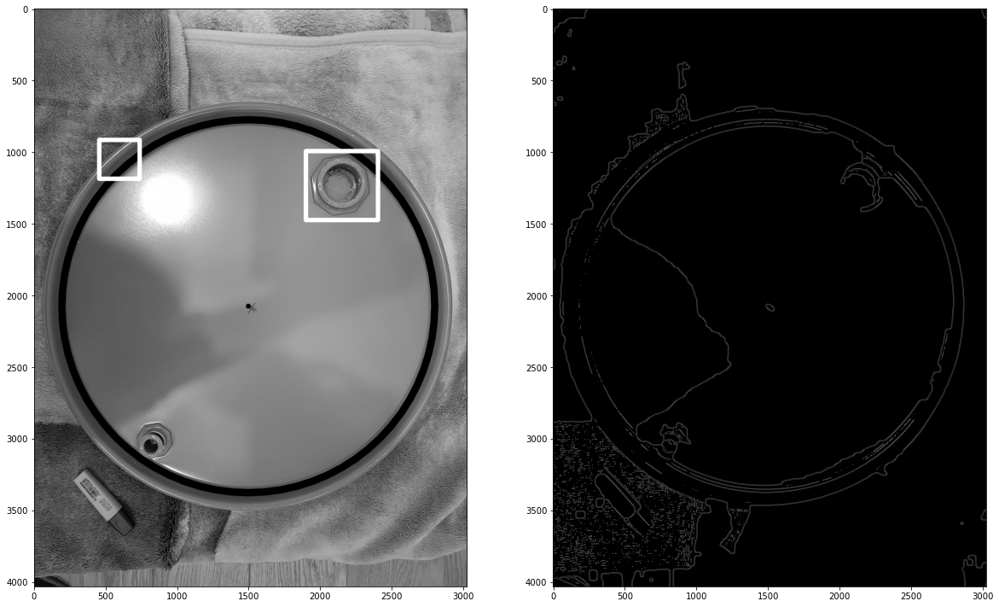

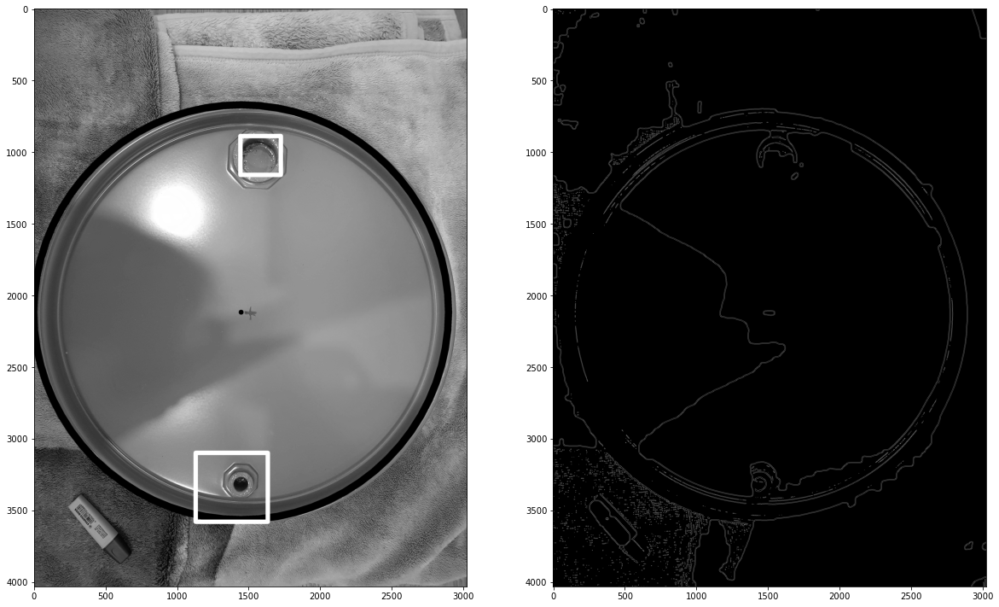

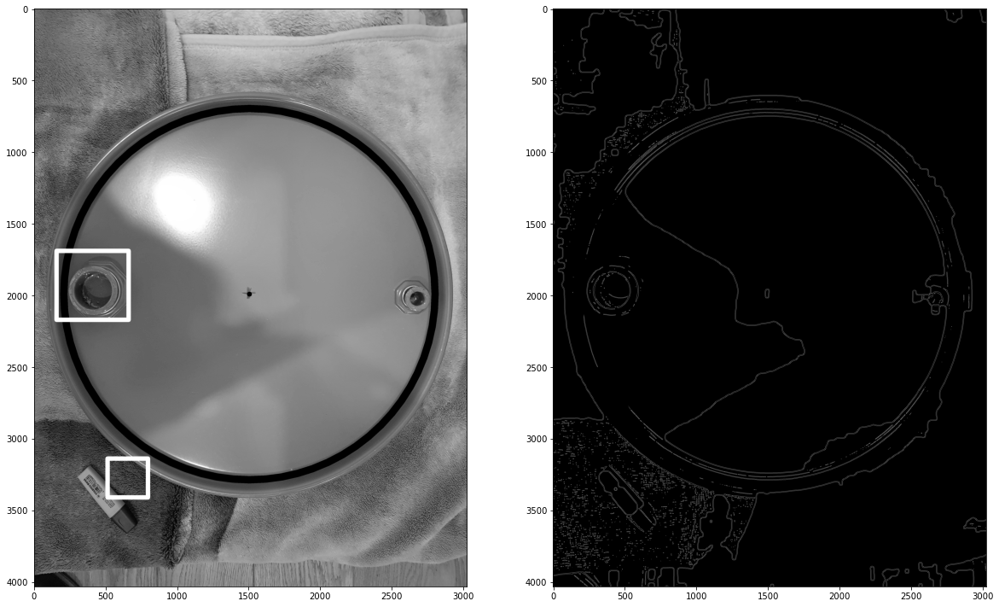

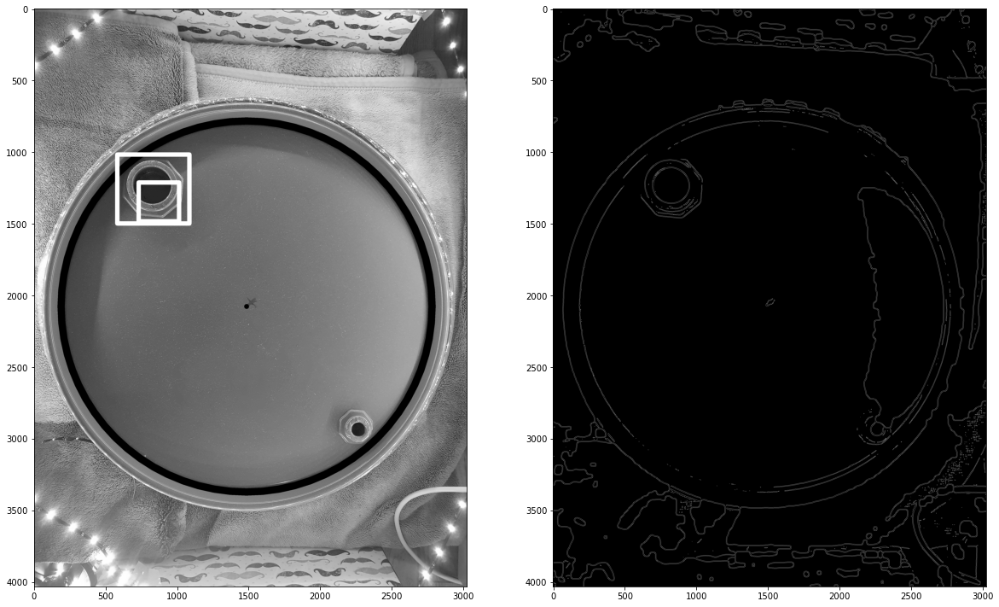

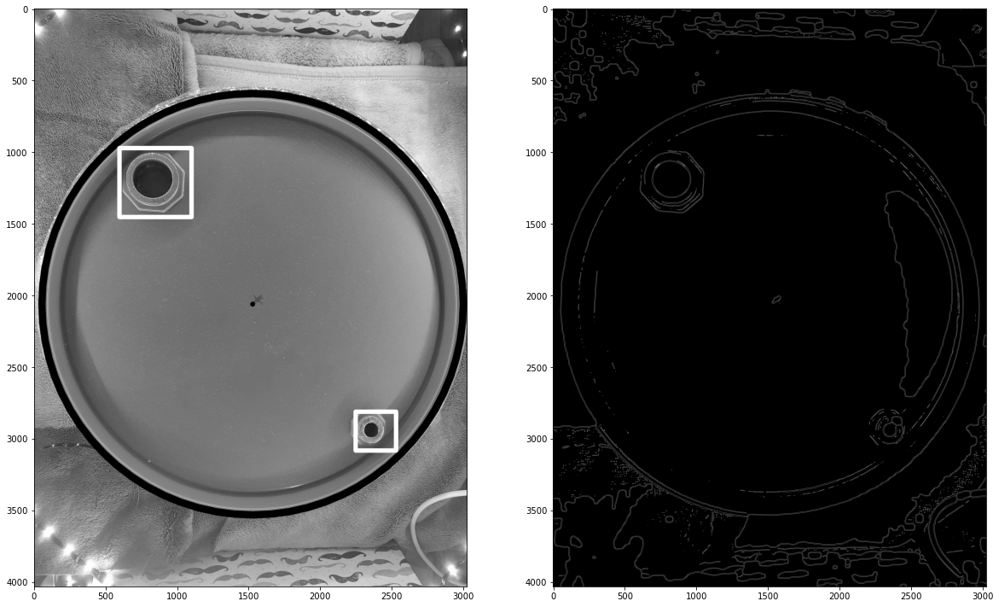

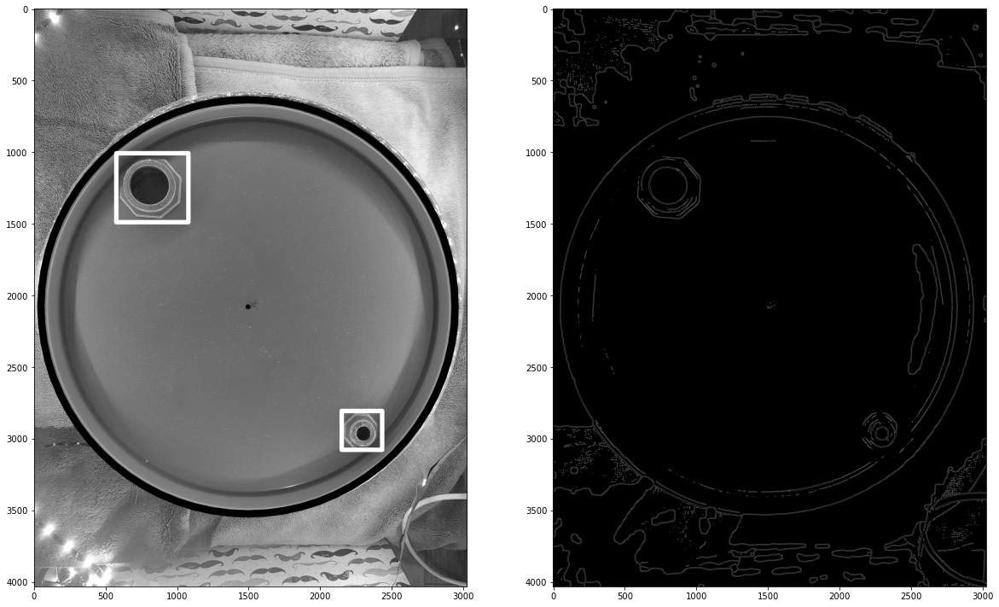

In [66]:
#load
images = [img1, img2, img3, img4, img5, img6, img7, img9, img10, img11]
#images = [img1, img4, img5]

for img in images:
    full_func(img)

# full bez funkcji

8.291257858276367 20.933905174619902


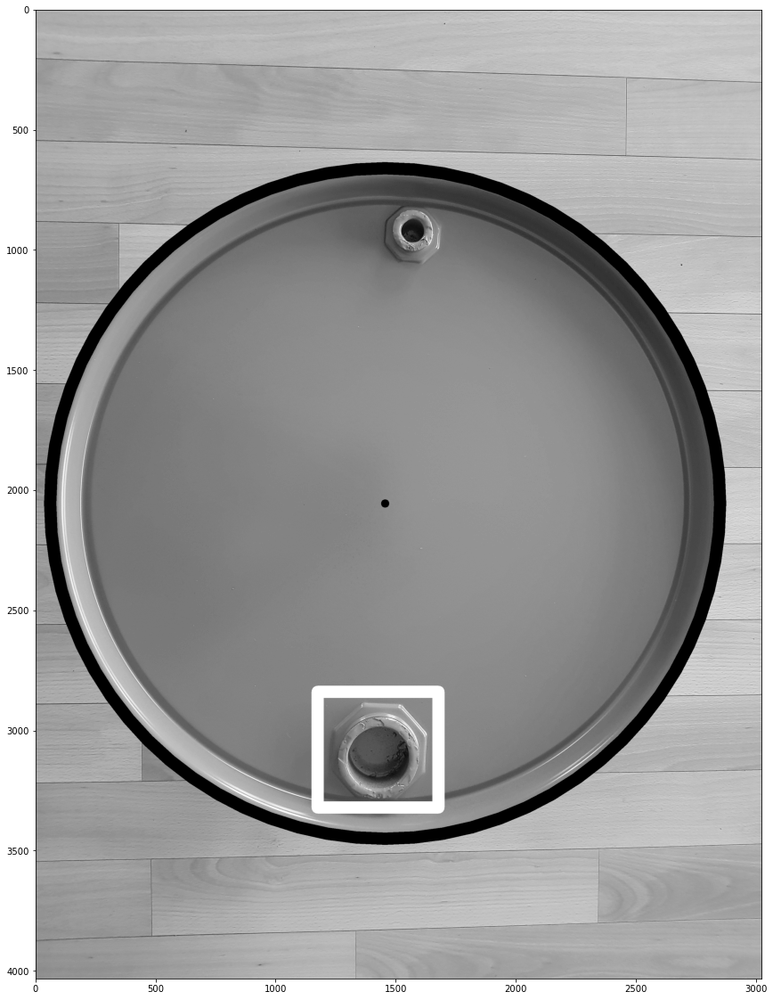

In [37]:
w_kd, h_kd = template_kd.shape[::-1]

ts = time.time()
#load
img = img1.copy()
#gray
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
_,th = cv2.threshold(img,150,255,cv2.THRESH_BINARY_INV)

#morph filters
kernel = np.ones((15,15),np.uint8)
kernel2 = np.ones((25,25),np.uint8)
morphed = cv2.morphologyEx(th, cv2.MORPH_OPEN, kernel)
morphed = cv2.morphologyEx(morphed, cv2.MORPH_CLOSE, kernel2)
fg = cv2.bitwise_and(img, img, mask=morphed)

#bin
fg_bin = cv2.medianBlur(fg,11) #############################################BYLO 5,7
fg_bin = cv2.adaptiveThreshold(fg_bin,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
fg_bin = cv2.medianBlur(fg_bin,5)
edges2 = cv2.Canny(fg_bin, 255/3, 255, apertureSize=3)

#circles
circles = cv2.HoughCircles(edges2,cv2.HOUGH_GRADIENT,1,3000, param1=5,param2=125,minRadius=1200,maxRadius=1800)

#print circles
circles = np.uint16(np.around(circles))
for c_i in circles[0,:]:
    # draw the outer circle
    cv2.circle(img,(c_i[0],c_i[1]),c_i[2],(0,0,255),50)
    # draw the center of the circle
    cv2.circle(img,(c_i[0],c_i[1]),2,(0,0,255),30)

#match template
res = cv2.matchTemplate(edges2,template_kd,method)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
top_left = max_loc
bottom_right = (top_left[0] + w_kd, top_left[1] + h_kd)
cv2.rectangle(img,top_left, bottom_right, 255, 50)
    
#calc dist from drum center to kd
d = ((bottom_right[0] - top_left[0])/2 + top_left[0], (bottom_right[1] - top_left[1])/2 + top_left[1])
c = (c_i[0], c_i[1])
dist = np.sqrt((c[0] - d[0])**2 + (c[1] - d[1]) **2)
r2 = c_i[2]*2
skala = r2/r2_ref
print(time.time() - ts, dist / skala)

plt.figure(figsize=(20,20))
plt.imshow(img, cmap='gray')